In [8]:
import gc

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

from sklearn.datasets import fetch_covtype
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, log_loss
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch import Tensor

import torch._dynamo
import torch.utils.benchmark as benchmark
from torch.optim import Optimizer
from torchinfo import summary
from torch.autograd import Function

In [9]:
def zeropower_via_newtonschulz5(G: Tensor, steps: int) -> Tensor:
    assert G.ndim >= 2
    a, b, c = 3.4445, -4.7750, 2.0315
    X = G.clone().float()
    if G.size(-2) > G.size(-1):
        X = X.mT
    X = X / (X.norm(dim=(-2, -1), keepdim=True) + 1e-7)
    for _ in range(steps):
        A = X @ X.mT
        B = b * A + c * A @ A
        X = a * X + B @ X
    if G.size(-2) > G.size(-1):
        X = X.mT
    return X

class Muon(Optimizer):
    def __init__(self, params, lr=0.02, weight_decay=0.01, momentum=0.95, nesterov=True, ns_steps=5):
        defaults = dict(lr=lr, weight_decay=weight_decay, momentum=momentum, nesterov=nesterov, ns_steps=ns_steps)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self):
        for group in self.param_groups:
            lr = group["lr"]
            weight_decay = group["weight_decay"]
            momentum = group["momentum"]
            nesterov = group["nesterov"]
            ns_steps = group["ns_steps"]

            for p in group["params"]:
                if p.grad is None:
                    continue
                g = p.grad.data

                if g.ndim < 2:
                    continue  # skip scalars, biases, etc.

                state = self.state[p]
                if "momentum_buffer" not in state:
                    state["momentum_buffer"] = torch.zeros_like(g)

                buf = state["momentum_buffer"]
                buf.mul_(momentum).add_(g)

                if nesterov:
                    g = g + momentum * buf
                else:
                    g = buf

                if g.ndim == 4:
                    g = g.view(g.size(0), -1)

                g = zeropower_via_newtonschulz5(g, steps=ns_steps).view_as(p)

                p.mul_(1 - lr * weight_decay)
                p.add_(g, alpha=-lr)

In [10]:
torch._dynamo.config.cache_size_limit = 16

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
device = torch.device("cpu")

In [11]:
df = sns.load_dataset('diamonds')
df = df[['carat', 'depth', 'table', 'price', 'x', 'y', 'z', 'cut']]

df['cut'] = (df['cut'] == 'Ideal').astype(int)

X = df.drop('cut', axis=1)
y = df['cut']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.long).to(device)

print(X.shape)
print(y.shape)

ideal_percentage = df['cut'].mean() * 100
print(f"Percentage of diamonds with 'Ideal' cut: {ideal_percentage:.2f}%")

model = LogisticRegression(penalty='l2', C=0.001, max_iter=10000)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

y_pred_proba = model.predict_proba(X_test)
loss = log_loss(y_test, y_pred_proba)

print(f"Test Accuracy: {accuracy * 100:.2f}%")
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Not Ideal', 'Ideal']))
print(model.coef_)
print(f"Log Loss: {loss:.6f}")

(53940, 7)
(53940,)
Percentage of diamonds with 'Ideal' cut: 39.95%
Test Accuracy: 79.30%
Classification Report:
              precision    recall  f1-score   support

   Not Ideal       0.82      0.85      0.83      6496
       Ideal       0.75      0.71      0.73      4292

    accuracy                           0.79     10788
   macro avg       0.79      0.78      0.78     10788
weighted avg       0.79      0.79      0.79     10788

[[-0.15688782 -0.46189194 -1.57368125  0.22509094 -0.08309788 -0.03167662
  -0.08671039]]
Log Loss: 0.451068


/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: divide by zero encountered in matmul
  raw_prediction = X @ weights + intercept
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: overflow encountered in matmul
  raw_prediction = X @ weights + intercept
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: invalid value encountered in matmul
  raw_prediction = X @ weights + intercept
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/nhatt/Downloads/All_Mac/Code/ML_experiments/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered

In [12]:
def train(model, criterion, optimizers, epochs):
    print(summary(model, input_data=X_train_tensor))

    torch.set_printoptions(threshold=float('inf'))
    for name, param in model.named_parameters():
        print(name)
        print(param)

    @torch._dynamo.explain
    def run_model(x):
        return model(x)

    run_model(X_train_tensor) # type: ignore

    best_test_loss = float('inf')

    train_losses = []
    test_losses = []

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()
        torch.cuda.synchronize()

    schedulers = [
        torch.optim.lr_scheduler.LinearLR(opt, start_factor=1.0, end_factor=0.05, total_iters=epochs)
        for opt in optimizers
    ]

    for epoch in range(1, epochs + 1):
        model.train()
        for opt in optimizers:
            opt.zero_grad()

        train_outputs = model(X_train_tensor)
        train_loss = criterion(train_outputs, y_train_tensor)
        train_loss.backward()

        for opt in optimizers:
            opt.step()

        model.eval()
        with torch.no_grad():
            test_outputs = model(X_test_tensor)
            test_loss = criterion(test_outputs, y_test_tensor)
            test_predictions = torch.argmax(test_outputs, dim=1)
            test_accuracy = (test_predictions == y_test_tensor).sum().item() / y_test_tensor.size(0)

        train_losses.append(train_loss.item())
        test_losses.append(test_loss.item())

        if test_loss.item() < best_test_loss:
            best_test_loss = test_loss.item()

        for scheduler in schedulers:
            scheduler.step()

        if epoch % 1 == 0:
            print(f"Epoch {epoch}/{epochs}, Train Loss: {train_loss.item():.32f}, Test Loss: {test_loss.item():.8f}, Test Accuracy: {test_accuracy:.4f}")

    if torch.cuda.is_available():
        gc.collect()
        torch.cuda.empty_cache()
        torch.cuda.synchronize()

        print(f"[GPU] Peak memory allocated: {torch.cuda.max_memory_allocated() / 1024 ** 2:.2f} MB")
        print(f"[GPU] Peak memory reserved: {torch.cuda.max_memory_reserved() / 1024 ** 2:.2f} MB")

    print()
    print(f"Lowest Test Loss: {best_test_loss:.8f}")

    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Test Loss Over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()  

In [ ]:
class MADBatchNorm1d(nn.Module):
    def __init__(self, num_features, eps=1e-5, momentum=0.1, affine=False, track_running_stats=True):
        super(MADBatchNorm1d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.track_running_stats = track_running_stats

        if self.track_running_stats:
            self.register_buffer('running_mean', torch.zeros(num_features))
            self.register_buffer('running_mad', torch.ones(num_features))
            self.running_mean: torch.Tensor
            self.running_mad: torch.Tensor
            self.register_buffer('num_batches_tracked', torch.tensor(0, dtype=torch.long))

    def forward(self, x):
        if x.dim() != 2:
            raise ValueError("Input must be 2D (batch, features)")

        if self.training or not self.track_running_stats:
            mean = x.mean(dim=0)
            mad = (x - mean).abs().mean(dim=0)

            if self.track_running_stats:
                with torch.no_grad():
                    self.running_mean.mul_(1 - self.momentum).add_(self.momentum * mean)
                    self.running_mad.mul_(1 - self.momentum).add_(self.momentum * mad)
                    self.num_batches_tracked += 1
            normed = (x - mean) / (mad + self.eps)

        else:
            normed = (x - self.running_mean) / (self.running_mad + self.eps)

        return normed

In [ ]:
class CustomActivation(nn.Module):
    def __init__(self, num_features):
        super().__init__()
        self.a = nn.Parameter(torch.full((num_features,), 1.0))
        self.b = nn.Parameter(torch.full((num_features,), 1.0))

    def forward(self, x):
        return torch.where(x >= 0, self.a * x, self.b * x)


class StableNN(nn.Module):
    def __init__(self, n, num_layers=2):
        super().__init__()
        self.initial_norm = nn.BatchNorm1d(n, affine=False, track_running_stats=True, momentum=0.0)

        self.linears = nn.ModuleList()
        self.pre_norms = nn.ModuleList()
        self.activations = nn.ModuleList()
        self.post_norms = nn.ModuleList()

        for _ in range(num_layers):
            self.linears.append(nn.Linear(n, n, bias=False))
            with torch.no_grad():
                nn.init.eye_(self.linears[-1].weight)

            self.pre_norms.append(MADBatchNorm1d(n, affine=False, track_running_stats=True, momentum=0.0))
            self.activations.append(CustomActivation(n))
            self.post_norms.append(MADBatchNorm1d(n, affine=False, track_running_stats=True, momentum=0.0))

            n *= 2

        self.final_linear = nn.Linear(n, 2, bias=True)
        with torch.no_grad():
            nn.init.zeros_(self.final_linear.weight)
            nn.init.zeros_(self.final_linear.bias)

    def forward(self, x):
        x = self.initial_norm(x)

        for linear, prenorm, activation, postnorm in zip(self.linears, self.pre_norms, self.activations, self.post_norms):
            out = linear(x)
            out = prenorm(out)
            out = activation(out)
            out = postnorm(out)

            x = torch.cat([x, out], dim=1)

        return self.final_linear(x)

In [33]:
class CrossEntropyWithL2(nn.Module):
    def __init__(self, base_criterion, model, l2_lambda):
        super().__init__()
        self.base_criterion = base_criterion
        self.model = model
        self.l2_lambda = l2_lambda

    def forward(self, outputs, targets):
        base_loss = self.base_criterion(outputs, targets)

        if not self.model.training:
            return base_loss

        l2_reg = torch.tensor(0., device=outputs.device)
        for param in self.model.parameters():
            l2_reg += torch.norm(param, 2)**2

        return base_loss + self.l2_lambda * l2_reg

In [35]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=6).to(device))
criterion = CrossEntropyWithL2(nn.CrossEntropyLoss(), model, l2_lambda=0.01)

optimizers = [
    optim.Rprop(model.parameters())
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                68,665
Total params: 68,665
Trainable params: 68,665
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 1.]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0

KeyboardInterrupt: 

In [ ]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=6).to(device))
criterion = CrossEntropyWithL2(nn.CrossEntropyLoss(), model, l2_lambda=0.005)

optimizers = [
    optim.Rprop(model.parameters())
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                68,665
Total params: 68,665
Trainable params: 68,665
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0

KeyboardInterrupt: 

In [27]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))
criterion = CrossEntropyWithL2(nn.CrossEntropyLoss(), model, l2_lambda=0.001)

optimizers = [
    optim.Rprop(model.parameters())
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                4,601
Total params: 4,601
Trainable params: 4,601
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 

KeyboardInterrupt: 

In [19]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))
criterion = CrossEntropyWithL2(nn.CrossEntropyLoss(), model, l2_lambda=0.001)

optimizers = [
    optim.Rprop(model.parameters())
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                4,601
Total params: 4,601
Trainable params: 4,601
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 

KeyboardInterrupt: 

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-15                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-16                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-17                  --                        --
│    │    └─BatchNorm1d: 3-4             [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-5                  [43152, 14]      

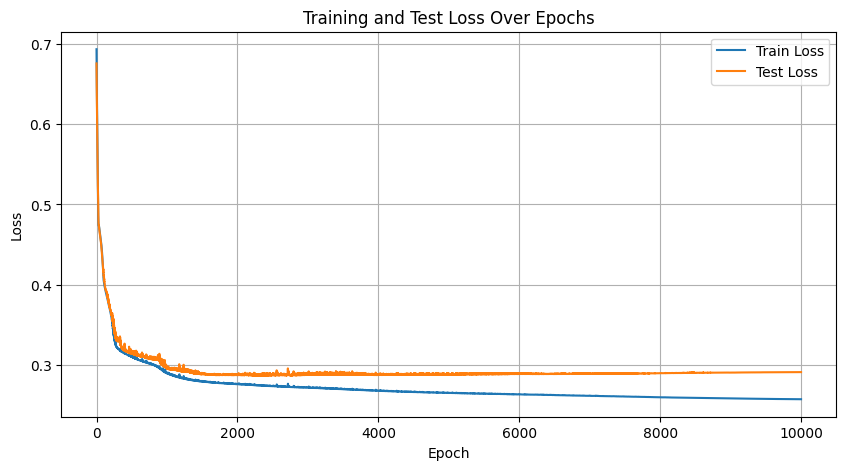

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-0.1369, -0.0166,  0.0860, -0.0035, -0.1669, -0.1341, -0.0477],
        [ 0.0473, -0.0597,  0.0641, -0.0526, -0.0399,  0.0272,  0.0266],
        [ 0.0064, -0.0192,  0.0159,  0.0411,  0.0079, -0.0025,  0.0031],
        [ 0.0457,  0.0078, -0.0202, -0.1520,  0.0567,  0.1249,  0.0615],
        [ 0.0885,  0.0322,  0.0225,  0.0364, -0.1593, -0.3123,  0.1587],
        [-0.0719, -0.0301, -0.0065, -0.0231, -0.3800, -0.3316,  0.0191],
        [-0.1186,  0.1001,  0.0040, -0.0987,  0.1116,  0.5636, -0.6990]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-0.1370, -0.1002, -0.0286, -0.0109, -0.1013, -0.0307, -0.0071, -0.1699,
          0.1038,  0.0588, -0.0456, -0.1063, -0.0457, -0.0344],
        [-0.0525, -0.2635, -0.0529, -0.0299,  0.0589, -0.0519, -0.0255,  0.0568,
         -0.3729, -0.0181,  0.0320,  0.0918, -0.0329, -0.0165],
        [-0.0062,  0.0437, -0.0130,  0.0155, -0.0264, -0.0250, -0.0077, -

In [24]:
# with variance scaling
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))
criterion = nn.CrossEntropyLoss()

optimizers = [
    optim.Adam(model.parameters())
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─MADBatchNorm1d: 2-1               [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-15                  --                        --
│    │    └─MADBatchNorm1d: 3-2          [43152, 7]                --
│    └─ModuleList: 2-16                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-17                  --                        --
│    │    └─MADBatchNorm1d: 3-4          [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-5                  [43152, 14]      

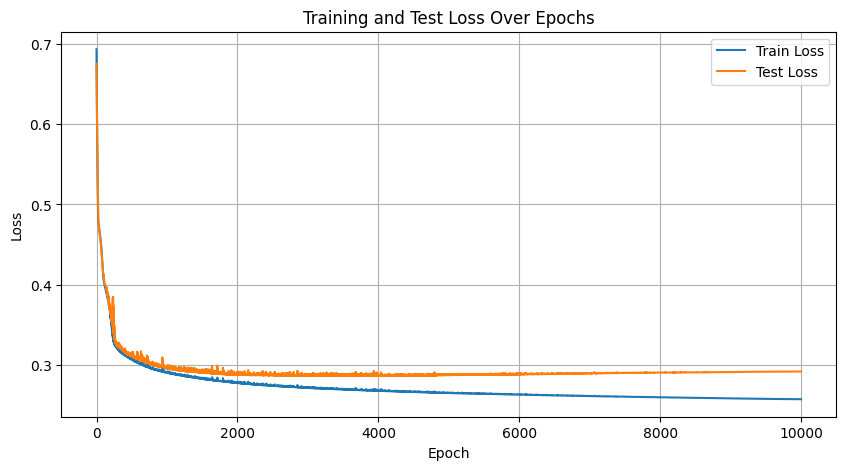

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-7.6222e-02, -3.0060e-02,  3.7863e-02,  2.4305e-03, -1.6205e-01,
         -8.0086e-02,  6.4135e-03],
        [ 8.1410e-03,  1.1937e-02,  6.5476e-02,  1.6883e-02, -1.4270e-02,
         -7.3189e-04,  2.5181e-02],
        [-7.2393e-03, -1.4131e-02,  2.9641e-02,  2.5812e-02,  3.3960e-03,
          2.5677e-03, -1.6117e-04],
        [ 2.3943e-01,  2.1729e-02,  4.3984e-03, -1.1892e-01, -9.0230e-02,
          1.7866e-01,  1.2584e-01],
        [-3.3904e-02, -1.7179e-03,  4.2519e-02,  1.4399e-02, -4.8163e-02,
         -5.4094e-02, -1.1704e-01],
        [-4.2099e-03,  8.4382e-03,  2.2486e-02, -8.0363e-03, -1.5601e-01,
         -2.9301e-02, -1.1003e-01],
        [ 6.8788e-02,  6.4927e-02, -4.8263e-02,  4.2533e-02,  3.0981e-01,
          1.0417e-01, -2.4190e-01]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-1.2927e-01, -4.1656e-02,  2.0874e-02,  1.5402e-02, -1.0097e-01,
          1.9345e-01, -1.7071e-01, -1

In [22]:
# with MAD scaling
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))
criterion = nn.CrossEntropyLoss()

optimizers = [
    optim.Adam(model.parameters())
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-15                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-16                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-17                  --                        --
│    │    └─BatchNorm1d: 3-4             [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-5                  [43152, 14]      

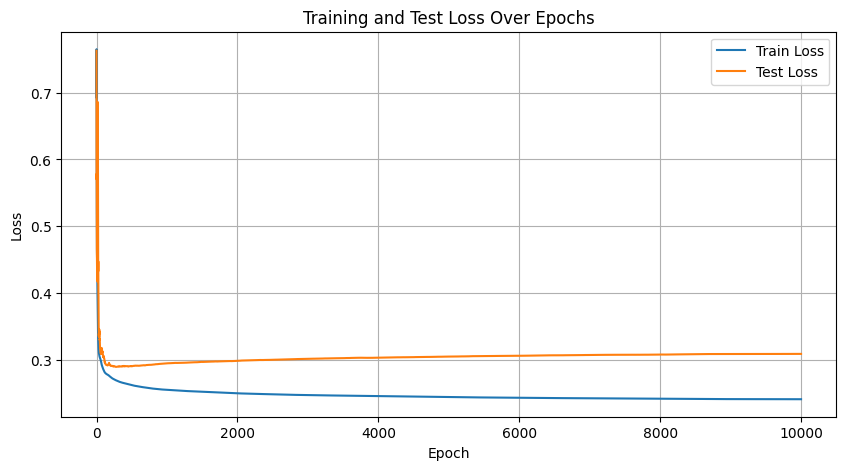

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-0.0454, -0.0058,  0.0692, -0.1180, -0.0675, -0.0547, -0.0192],
        [-0.0058, -0.0549,  0.2481, -0.0313, -0.0047,  0.0159,  0.0052],
        [-0.0297, -0.0277,  0.0371, -0.0172, -0.0355, -0.0378, -0.0135],
        [-0.0356, -0.0026,  0.0706,  0.1383,  0.1526, -0.0421, -0.0497],
        [-0.0920, -0.0215,  0.0110, -0.0299, -0.0128, -0.0879, -0.2128],
        [ 0.0220, -0.0578,  0.0082, -0.0550, -0.2509,  0.0114, -0.0235],
        [ 2.0953, -0.0503,  0.0631, -0.2785,  2.3687,  0.0934, -1.8749]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-6.0700e-02, -5.8894e-02,  6.8440e-02, -1.1792e-02, -1.2387e-01,
         -1.2744e-02, -4.4124e-02, -4.2929e-03,  7.9654e-03,  1.5649e-02,
         -1.1108e-01, -1.1558e-01, -1.2226e-02,  6.2749e-02],
        [ 4.4935e-02, -1.3271e+00,  4.1634e-01,  1.0286e-01,  7.5308e-03,
          2.7984e-02,  1.1341e-01, -8.6412e-02,  4.1037e+00, -4.5655e-01,
     

In [20]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))

optimizers = [
    optim.Rprop(model.parameters(), lr=0.01)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─MADBatchNorm1d: 2-1               [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-15                  --                        --
│    │    └─MADBatchNorm1d: 3-2          [43152, 7]                --
│    └─ModuleList: 2-16                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-17                  --                        --
│    │    └─MADBatchNorm1d: 3-4          [43152, 7]                --
│    └─ModuleList: 2-14                  --                        (recursive)
│    │    └─Linear: 3-5                  [43152, 14]      

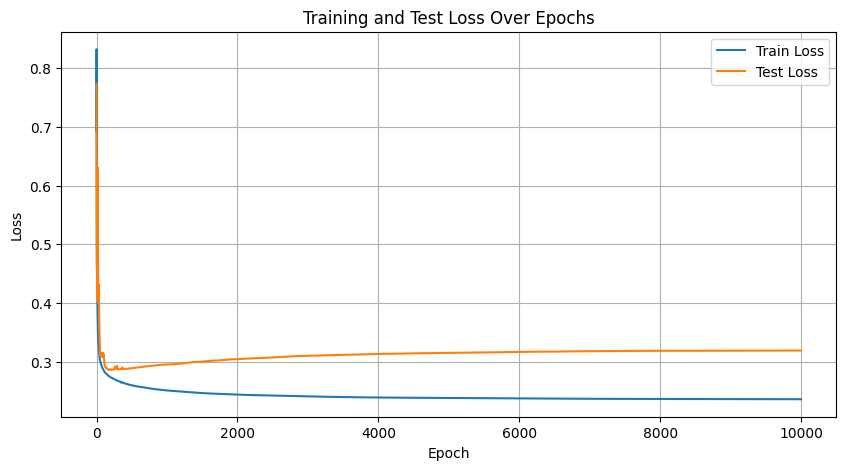

_orig_mod.linears.0.weight
Parameter containing:
tensor([[ 1.6311e-01,  1.7069e-02,  2.7444e-02, -4.6672e-02, -3.8143e-02,
          3.7416e-03,  1.0359e-01],
        [-6.6025e-03, -3.0558e-02,  2.2644e-01, -4.6624e-02, -9.9291e-03,
          7.9440e-03, -1.4161e-02],
        [-1.4301e-02,  2.4831e-02, -1.7986e-01, -2.4998e-02,  5.7778e-02,
         -4.6822e-04,  4.4855e-03],
        [-1.3876e-01,  1.8873e-02,  5.8484e-03, -3.1002e-02,  7.3031e-02,
          2.3622e-02, -2.4936e-01],
        [-1.5974e-02, -5.6133e-03,  2.0390e-02, -3.1226e-02,  2.0370e-02,
         -4.3147e-01, -1.3978e-01],
        [-1.5277e-01, -1.7248e-02,  1.0426e-02, -2.7214e-02, -6.3812e-01,
          2.5094e-02, -1.2961e-01],
        [ 2.5549e-02,  1.0447e-01,  8.3140e-03, -3.1999e-02,  3.3362e-02,
         -4.1495e-02, -3.3085e-02]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-2.3419e-02, -2.3693e-02,  3.4470e-02, -5.9204e-02, -6.9281e-02,
         -1.4124e-02, -8.3077e-02, -4

In [18]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))

optimizers = [
    optim.Rprop(model.parameters(), lr=0.01)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

In [14]:
optimizers = [
    optim.Rprop(model.parameters(), lr=0.01)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                4,601
Total params: 4,601
Trainable params: 4,601
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[-1.8306e-02, -5.5086e-02,  9.9012e-02, -1.0264e-01, -6.6838e-02,
         -7.9848e-02, -4.5590e-02],
        [-9.0697e-02,  2.1085e-02,  1.3471e-01, -3.2283e-02, -4.8708e-02,
          4.6748e-02, -1.6896e-02],
        [-1.2664e-01, -5.7972e-02, -1.3204e-01, -4.6309e-01,  1.3819e-01,
          2.3582e-02,  1.0300e-01],
        [-2.2362e-02,  3.0602e-03, -1.1851e-03, -4.6878e-04, -1.4783e-02,
         -4.5342e-03, -1.3918e-02],
        [-2.2840e-02, -1.9641e-02,  6.5808e-03, -1.5013e-02, -1.1600e-03,

KeyboardInterrupt: 

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                4,601
Total params: 4,601
Trainable params: 4,601
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 

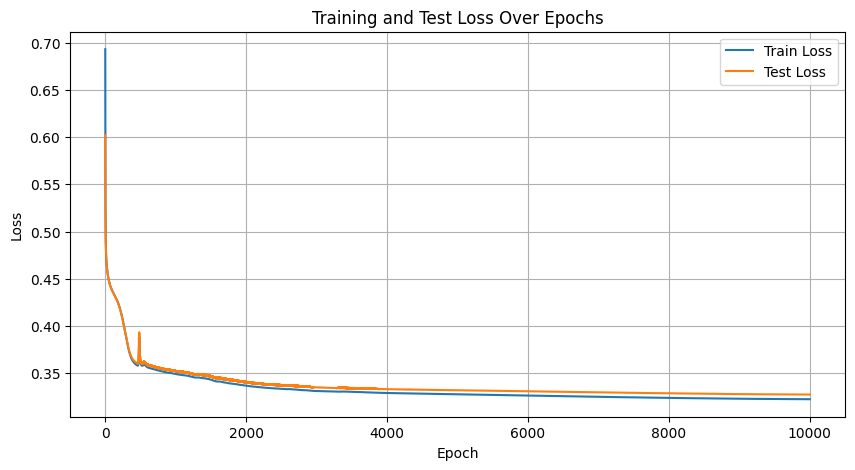

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-1.7561e-02, -5.4159e-02,  1.0022e-01, -9.7945e-02, -6.3966e-02,
         -7.8400e-02, -4.4963e-02],
        [-9.0860e-02,  2.1123e-02,  1.3489e-01, -3.1631e-02, -4.8532e-02,
          4.5995e-02, -1.6135e-02],
        [-1.2641e-01, -5.9239e-02, -1.3267e-01, -4.6416e-01,  1.3881e-01,
          2.3716e-02,  1.0227e-01],
        [-2.1777e-02,  3.4772e-03, -1.4405e-03, -4.4099e-04, -1.4240e-02,
         -4.3100e-03, -1.3353e-02],
        [-2.2445e-02, -1.9467e-02,  7.5467e-03, -1.4718e-02, -1.1133e-03,
         -2.7188e-02, -1.8266e-02],
        [-1.1660e-02, -2.0171e-02,  1.1937e-03, -1.5386e-02, -3.7111e-02,
         -1.3167e-03, -2.1833e-02],
        [-2.2180e-03,  5.2415e-03,  2.7400e-02, -1.9873e-03,  3.4304e-03,
         -4.3921e-03, -4.0827e-04]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-2.5242e-04, -4.4562e-03,  1.2089e-02,  2.7095e-04,  3.0724e-03,
         -8.3371e-03, -1.7955e-03,  4

In [12]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))
criterion = nn.CrossEntropyLoss()

optimizers = [
    optim.SGD(model.parameters(), lr=0.05)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

In [9]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=4).to(device))
criterion = nn.CrossEntropyLoss()

optimizers = [
    optim.SGD(model.parameters(), lr=0.1)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                4,601
Total params: 4,601
Trainable params: 4,601
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0.]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 

KeyboardInterrupt: 

Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  --                        --
│    │    └─BatchNorm1d: 3-4             [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-5                  [43152, 14]      

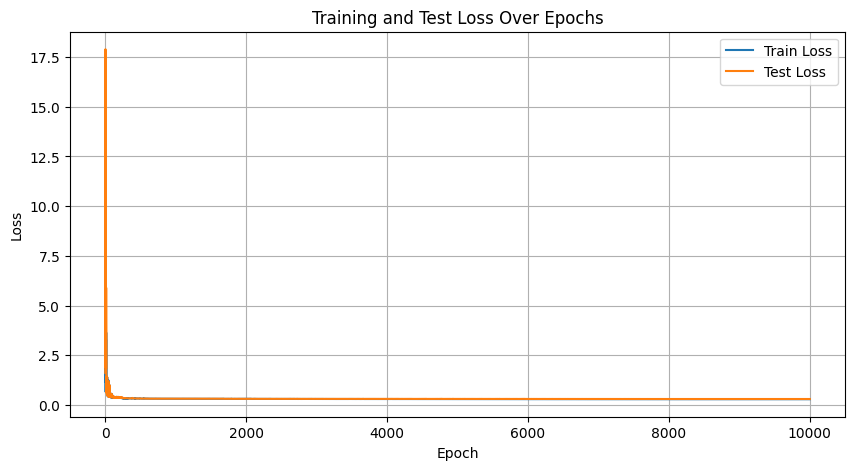

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-9.8588e-01, -1.2129e-01, -1.9540e+00,  2.3949e-02,  1.3999e-01,
         -1.7768e-03,  9.3328e-04],
        [-4.8101e-01, -1.8589e-01, -7.5772e-02,  4.5629e-01, -9.9382e-01,
          7.6155e-01,  1.0698e-01],
        [ 3.4500e-01,  2.5140e-01,  4.9393e-01, -5.9037e-01,  6.6948e-01,
         -7.9659e-01, -1.2508e-01],
        [-1.0248e-01, -9.2432e-01, -1.5117e-01,  4.5907e-01, -7.8744e-01,
          1.0741e-01, -6.5825e-01],
        [-5.5900e-02, -1.0770e-01, -4.6740e-01,  1.6212e-02,  8.9763e-01,
         -1.1867e+00, -7.1702e-01],
        [-3.5769e-01, -1.8402e+00, -2.8353e-01, -1.3471e-02,  1.2052e+00,
         -8.2539e-01, -4.6592e-01],
        [ 1.2965e-01,  1.2562e+00, -8.5008e-01, -4.3844e-01, -2.6509e-01,
          2.0326e-01,  8.8339e-02]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 1.3465e-01,  4.4431e-01,  5.0079e-01, -1.0257e-01, -5.0142e-01,
         -4.2898e-01,  4.2232e-02, -8

In [7]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

optimizers = [
    optim.SGD(model.parameters(), lr=1.0)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  -- 

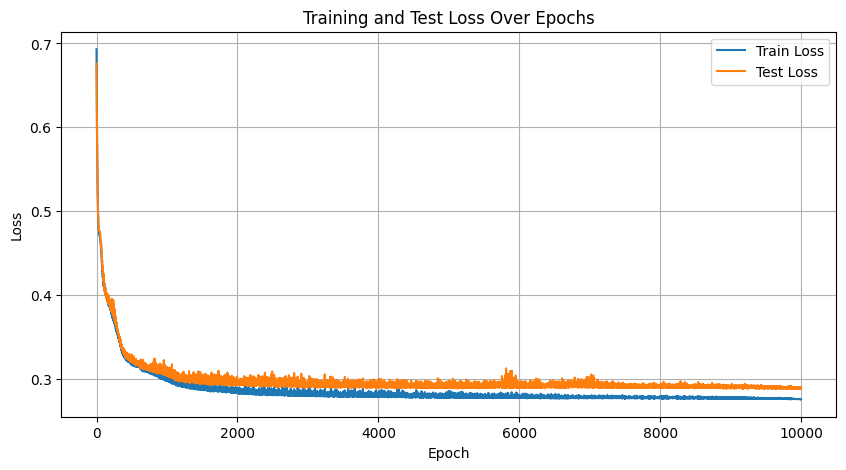

_orig_mod.linears.0.weight
Parameter containing:
tensor([[ 0.1988,  0.0447,  0.0830, -0.0339, -0.2055, -0.3264,  0.0129],
        [-0.1726,  0.0144,  0.2458,  0.0226,  0.1840,  0.0684, -0.0781],
        [ 0.0343,  0.0659, -0.0100, -0.0312, -0.1057,  0.1916, -0.0914],
        [-0.0109, -0.1551, -0.2723, -0.0284, -0.1818, -0.1878,  0.0724],
        [-0.1880,  0.0878,  0.1049, -0.0355, -0.0308, -0.3586, -0.0292],
        [-0.2697,  0.1092, -0.0446,  0.1584, -0.4045,  0.2675, -0.0646],
        [-0.0249,  0.0017,  0.0188, -0.0979, -0.0272, -0.0473,  0.0301]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 6.8351e-02, -7.9897e-02, -8.8030e-02,  1.2995e-01, -7.5169e-02,
         -1.0436e-01, -8.4317e-02, -1.9667e-02,  2.5672e-01,  8.2995e-02,
          6.8771e-02,  8.5269e-02, -2.9894e-02, -1.1603e-01],
        [-1.6369e-01, -3.5383e-03,  2.3723e-01, -7.9519e-03,  1.5749e-01,
         -1.2023e-02, -4.6853e-02,  5.7444e-02,  5.3426e-02, -1.3106e-02,
     

In [48]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=1.0),
    optim.AdamW(adamw_params, weight_decay=1.0)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  -- 

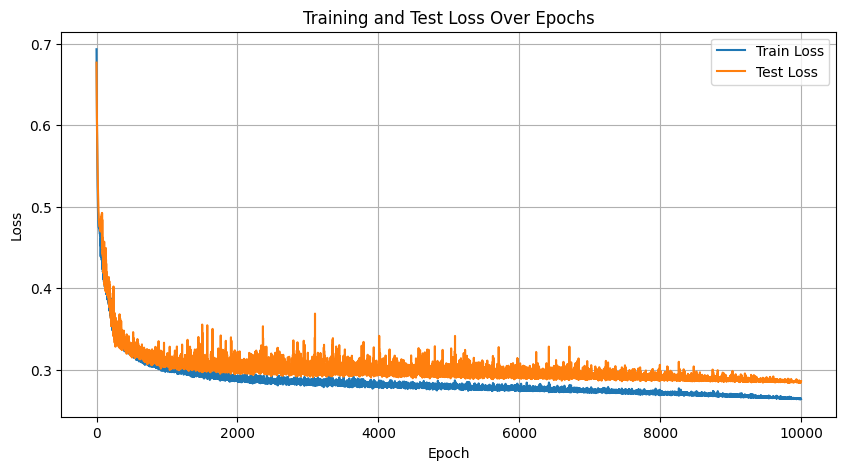

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-1.0257e-01, -1.9025e-03, -4.7867e-03, -3.1864e-03, -1.9221e-02,
          6.4924e-02,  2.6740e-03],
        [ 7.6649e-02,  5.5294e-03,  2.6340e-03, -4.3260e-02, -1.0905e-01,
          6.0245e-02, -8.9080e-03],
        [-1.3843e-02, -2.2900e-05,  4.9520e-03, -7.9014e-03,  1.1060e-01,
         -1.1160e-01,  3.8673e-06],
        [ 1.7902e-02,  8.8696e-02,  2.5067e-02, -5.5954e-03, -8.7278e-02,
          4.4166e-02,  3.0922e-02],
        [ 6.4379e-02, -1.0335e-03,  2.3388e-02, -2.3082e-02,  2.4605e-02,
         -4.3410e-02, -3.4806e-03],
        [-7.1883e-02,  1.3987e-04,  4.7919e-02,  1.3662e-02,  1.5964e-02,
          1.5796e-02,  1.4135e-02],
        [ 2.3719e-02, -6.9741e-04,  6.4589e-02, -2.8720e-04, -6.9890e-02,
          5.2931e-02, -1.4283e-02]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-1.5860e-02,  8.8280e-03,  1.5359e-02, -7.3560e-03,  5.2581e-02,
          1.0251e-02,  1.2197e-02,  2

In [45]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=1.0),
    optim.AdamW(adamw_params, weight_decay=1.0)
]

train(model, criterion, optimizers, epochs=10000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                1,241
Total params: 1,241
Trainable params: 1,241
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 1.]], requires_grad

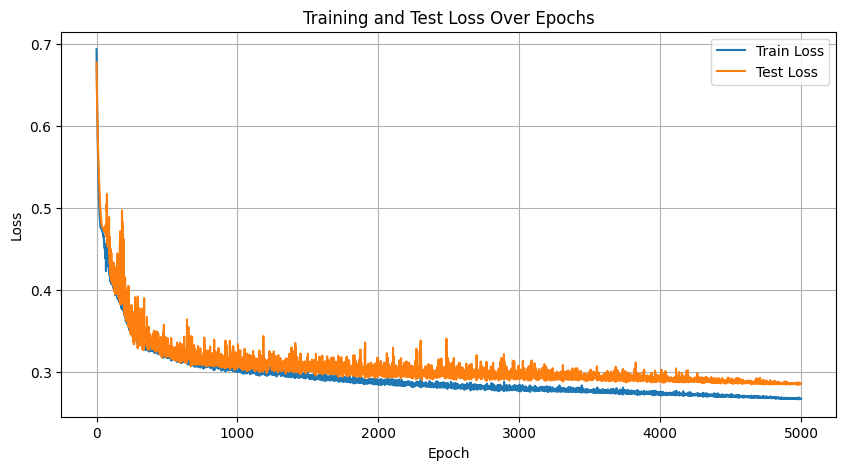

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-0.0034,  0.0041,  0.0366, -0.0032, -0.1024,  0.1239, -0.0118],
        [ 0.0319,  0.0310, -0.0050, -0.0087, -0.0963,  0.0438, -0.0109],
        [ 0.0199, -0.0012, -0.0072,  0.0072, -0.1125,  0.0887,  0.0239],
        [ 0.0383,  0.0525, -0.0008, -0.0108, -0.0748,  0.0132,  0.0690],
        [ 0.1551,  0.0032,  0.0184, -0.0675, -0.0161, -0.0237, -0.0158],
        [-0.0392,  0.0185,  0.0263,  0.0073,  0.0205, -0.0680,  0.0900],
        [ 0.0045, -0.0034,  0.0521,  0.0012,  0.0718, -0.0985,  0.0116]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 3.5882e-02,  1.7180e-02, -8.8809e-03,  1.2423e-02,  1.1883e-01,
         -1.0141e-01, -6.9824e-02,  2.6600e-05, -1.0117e-02,  2.0879e-02,
          1.8250e-03, -5.1295e-02, -8.7808e-03,  2.2441e-02],
        [-3.9825e-02,  4.7766e-02,  5.2388e-02,  1.6565e-02,  2.4279e-02,
         -4.6682e-02, -1.2055e-02, -8.8618e-03,  2.0536e-02,  3.1417e-02,
     

In [42]:
# Conclusion: no final norm, just identity init with prelu best

model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=1.0),
    optim.AdamW(adamw_params, weight_decay=1.0)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                1,241
Total params: 1,241
Trainable params: 1,241
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 0
Input size (MB): 1.21
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 1.21
_orig_mod.linears.0.weight
Parameter containing:
tensor([[1., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 1.]], requires_grad

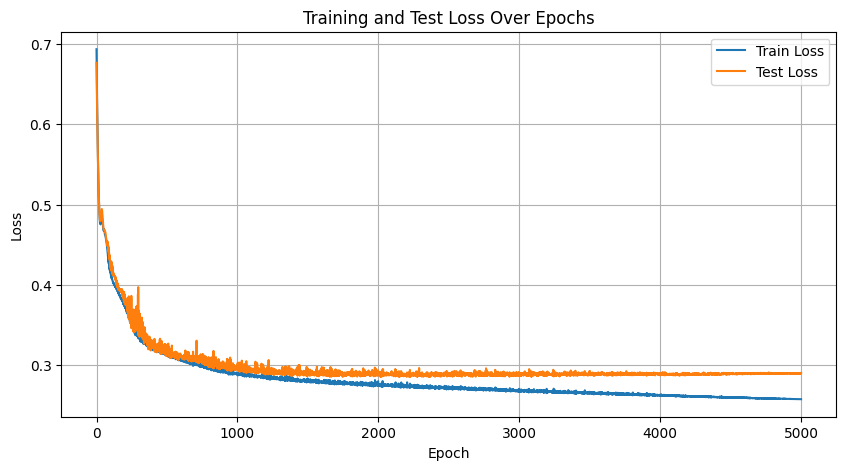

_orig_mod.linears.0.weight
Parameter containing:
tensor([[ 0.1068,  0.0218,  0.4462, -0.0078, -0.6529,  0.3933,  0.1199],
        [ 0.0170,  0.3259,  0.1160, -0.1399, -0.3960,  0.2629,  0.3248],
        [-0.0487,  0.0856,  0.4437, -0.0232, -0.0476,  0.5931, -0.3642],
        [-0.3835,  0.1015,  0.2082,  0.2002, -0.1041, -0.3805,  0.6764],
        [-0.1306, -0.0547,  0.0682, -0.1482,  0.9437, -0.5175, -0.2554],
        [ 0.1657, -0.0676,  0.1633, -0.0216, -0.9758,  0.5967,  0.3100],
        [ 0.1082, -0.4512, -0.1849, -0.1494,  0.7706,  0.0175, -0.6994]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 5.7793e-01,  1.0718e-01, -2.3555e-01, -2.2068e-01, -3.7694e-01,
          3.4856e-01, -2.8317e-01, -3.2854e-03, -2.4769e-02,  2.1556e-01,
         -3.8317e-02,  3.5363e-02,  3.2798e-01,  1.8576e-02],
        [-3.0801e-01,  2.8761e-01,  7.7841e-01, -3.2976e-02, -2.2982e-01,
          2.2474e-01,  1.5323e-01, -1.8776e-01,  3.4170e-01, -2.6448e-01,
     

In [ ]:
# Conclusion: no final norm, just identity init with prelu best

model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=0.1),
    optim.AdamW(adamw_params, weight_decay=0.1)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  -- 

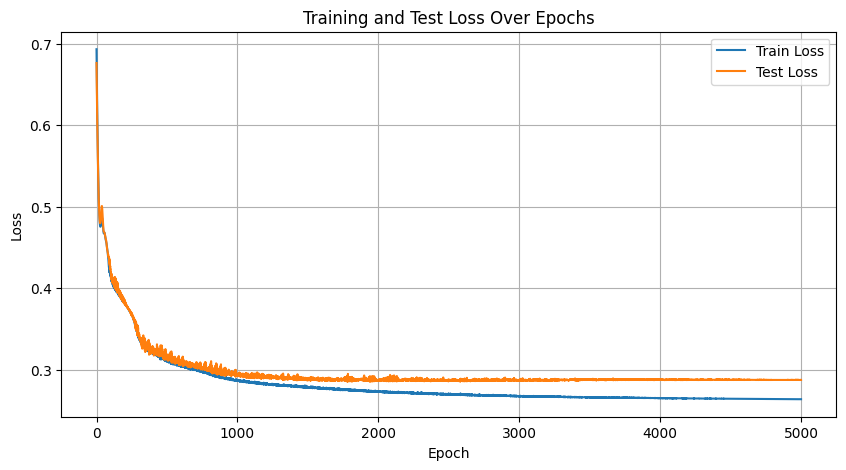

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-0.8571, -0.2290, -2.4177,  0.0761,  2.2206, -2.1165,  0.9192],
        [ 0.1770,  2.1745,  0.5679, -0.3478, -1.1308,  1.1939,  0.1692],
        [ 1.5239, -0.0651,  1.6535,  0.3821,  0.7856, -2.4730,  0.2420],
        [-2.5121,  1.5313, -0.0653, -0.5059,  3.2751,  1.5979,  0.0445],
        [-1.8625,  0.4018,  0.5696,  1.1974,  3.0643, -1.7125,  0.5203],
        [ 0.6581,  0.6907,  0.8024,  0.0434, -1.0518,  1.4802,  0.7446],
        [-0.4937, -0.3600,  1.0716, -0.0887, -3.8028,  3.5808,  1.1751]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 0.7812, -0.4922,  2.7411,  0.5091, -4.1048,  1.6065,  3.3440, -2.8488,
         -0.3224, -3.6480,  0.4323,  0.5647, -0.8073, -0.1190],
        [-1.4083, -0.1254,  2.2522,  0.9539,  0.9519, -1.5773,  1.3730, -2.4682,
          0.3025, -1.7086,  1.2637, -0.9422,  0.6705, -3.4903],
        [ 1.4750, -0.6829,  2.5532,  1.0570, -0.6386, -1.3433,  0.8054,  

In [40]:
# Conclusion: no final norm, just identity init with prelu best

model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=0.0),
    optim.AdamW(adamw_params, weight_decay=0.0)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  -- 

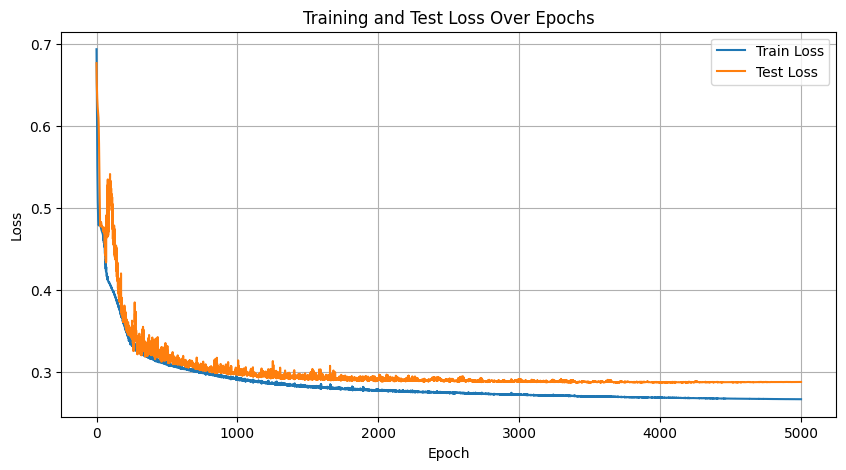

_orig_mod.linears.0.weight
Parameter containing:
tensor([[ 0.2609, -0.2561,  2.3716,  0.0722, -2.4104,  0.0637,  1.7717],
        [ 1.2265, -0.0088,  0.9752, -2.3844, -2.0911, -0.1794,  1.5797],
        [ 0.9971,  1.7558, -0.3894, -0.1977, -0.5524, -1.4263,  0.0986],
        [-1.0213,  1.2277,  0.9566,  0.2162,  2.9964, -1.6373,  1.8231],
        [-0.3155, -2.1346,  0.1225, -0.2411, -1.8203,  0.4164,  0.7795],
        [-0.4697,  0.5077, -0.8793,  0.1385, -2.6728,  0.6543, -0.9584],
        [-0.6624, -0.0443,  1.3518,  0.2350,  1.2952, -0.8886, -2.0316]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 5.1737e-01, -6.0905e-01, -7.3919e-01, -1.4106e+00, -2.5831e+00,
         -7.1940e-01,  1.5963e+00, -1.9365e+00, -6.9726e-01,  4.2437e-01,
          2.6239e+00,  6.0390e-01,  1.7390e+00, -5.9700e-01],
        [-1.6073e+00, -7.8157e-01, -2.1949e+00, -1.1092e+00, -6.5317e-01,
          9.9000e-01,  1.8796e-01,  3.1895e+00, -1.6713e+00, -2.0417e-01,
     

In [37]:
# residual after activation

model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=0.0),
    optim.AdamW(adamw_params, weight_decay=0.0)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  -- 

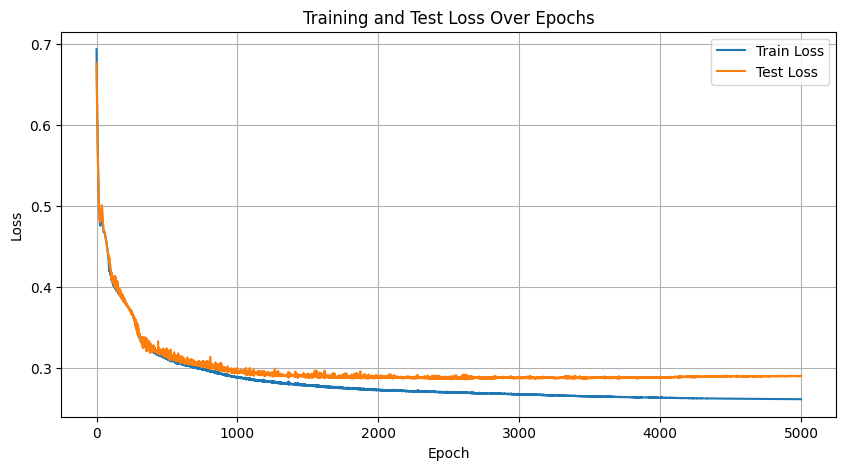

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-0.9591, -0.2317, -2.0245, -0.0742,  2.6063, -2.9840,  0.6736],
        [-0.0304,  0.7596,  0.3848, -0.1695, -1.1399,  1.4709,  0.0467],
        [ 1.7803, -0.1663,  0.4957,  0.1554,  0.2374, -1.5761, -0.2259],
        [-2.6969,  1.4893,  0.2292, -2.0670,  5.0568,  0.4649, -0.0579],
        [-1.0299,  0.2710,  0.3910,  0.8953,  2.1212, -2.6340,  0.3389],
        [ 0.3610,  0.1388,  0.5662, -0.0581, -3.1529,  1.3811,  2.4829],
        [ 0.0738, -0.7597,  1.4773, -0.1857, -3.7036,  2.6769,  0.9026]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[ 1.6832e+00, -1.0832e-01,  1.7499e+00,  1.4236e+00, -8.9793e-01,
         -2.8815e+00,  4.3732e+00, -2.6860e+00,  4.9606e-01, -2.1143e+00,
          7.3841e-01, -1.4544e+00, -4.3691e+00,  2.7544e+00],
        [-9.5088e-01, -3.3809e-01, -1.6247e+00,  8.9973e-01,  3.1711e+00,
         -3.6208e+00,  5.6688e-01, -2.8243e+00, -1.0421e-01,  5.3120e-01,
     

In [35]:
# no final norm

model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=0.0),
    optim.AdamW(adamw_params, weight_decay=0.0)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13                  -- 

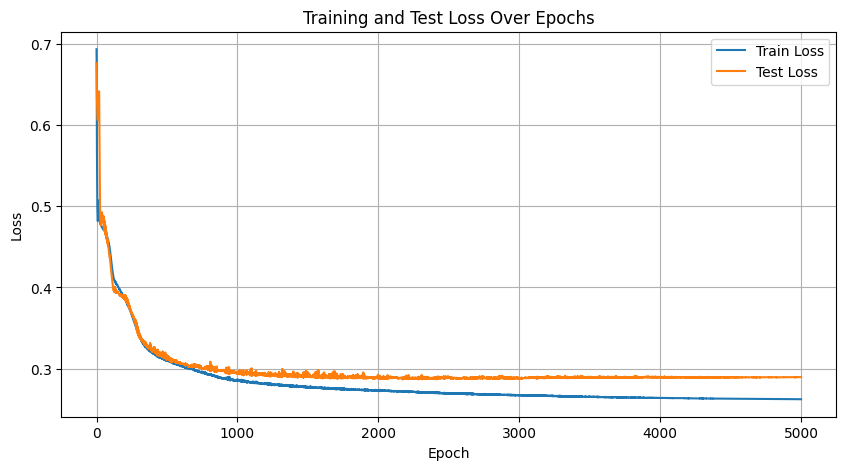

_orig_mod.linears.0.weight
Parameter containing:
tensor([[ 4.1880,  1.4660,  0.4591, -1.4439, -2.0315, -1.4676, -0.8236],
        [ 2.9160, -0.8179, -0.0525,  0.1909, -2.8121,  1.4831, -3.3631],
        [-1.2609,  0.1138,  4.5216, -0.3547,  1.4485, -0.7475,  1.0108],
        [ 0.4787, -2.5894,  0.5524, -0.8762,  1.4359, -1.0167, -1.3925],
        [ 0.7901,  2.0564,  0.7647,  0.4883, -2.5682,  0.4687,  0.1167],
        [-0.0831,  2.7537,  0.7984, -0.5098, -1.6563,  1.4350,  0.7929],
        [ 0.0591,  0.5031,  0.3549, -0.0120, -3.7185,  2.7443,  0.0256]],
       requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-1.0557e+00,  3.8160e-01,  2.1355e+00,  4.8160e-01, -5.6379e-01,
         -7.0484e-01, -1.7994e+00,  8.5597e-02,  4.5960e-02, -1.3737e+00,
          2.2749e+00,  1.3051e+00,  1.2902e+00,  1.1239e-01],
        [ 1.2792e+00,  2.0053e-01,  2.3601e+00,  1.6875e+00, -9.6574e-01,
          5.7574e-01,  1.8572e-01, -1.0359e+00,  1.9654e+00, -1.0642e+00,
     

In [31]:
# no final norm

model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=0.0),
    optim.AdamW(adamw_params, weight_decay=0.0)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)

Muon parameters:
torch.Size([7, 7])
torch.Size([14, 14])
torch.Size([28, 28])
torch.Size([2, 56])

AdamW parameters:
torch.Size([7])
torch.Size([7])
torch.Size([14])
torch.Size([14])
torch.Size([28])
torch.Size([28])
torch.Size([2])
torch.Size([2])
Layer (type:depth-idx)                   Output Shape              Param #
OptimizedModule                          [43152, 2]                --
├─StableNN: 1-1                          [43152, 2]                --
│    └─BatchNorm1d: 2-1                  [43152, 7]                --
│    └─ModuleList: 2-10                  --                        (recursive)
│    │    └─Linear: 3-1                  [43152, 7]                49
│    └─ModuleList: 2-11                  --                        --
│    │    └─BatchNorm1d: 3-2             [43152, 7]                --
│    └─ModuleList: 2-12                  --                        (recursive)
│    │    └─CustomActivation: 3-3        [43152, 7]                14
│    └─ModuleList: 2-13     

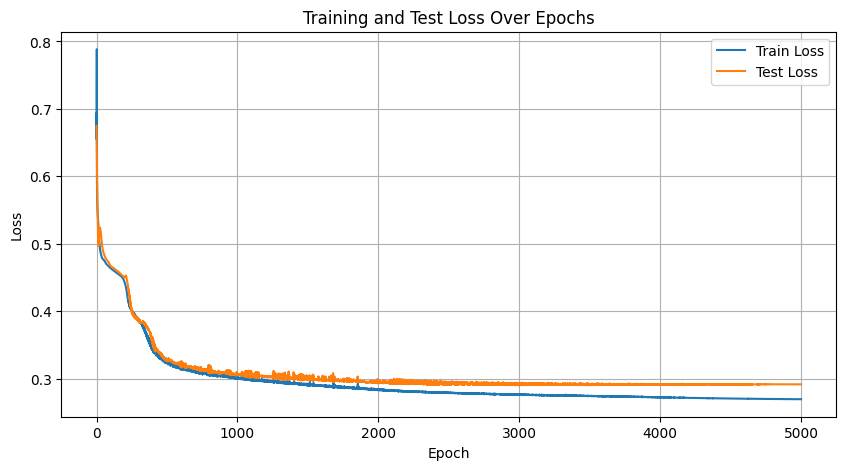

_orig_mod.linears.0.weight
Parameter containing:
tensor([[-1.7784e+00,  2.0014e+00, -1.0576e-01,  4.8934e-01,  1.1956e-01,
         -1.2585e+00, -1.2193e+00],
        [-1.9697e+00,  2.4388e+00,  2.3360e+00, -2.2015e-01,  4.2348e+00,
         -7.8450e-01,  1.0478e+00],
        [ 7.7687e-01, -9.5984e-01,  3.6393e+00, -2.6237e-01, -7.9472e-01,
         -1.1525e+00,  9.4563e-01],
        [ 1.8925e-01, -1.6403e+00,  4.2554e-01, -9.5006e-01, -2.3256e+00,
         -2.0440e-01,  7.5835e-01],
        [-1.5207e+00, -7.6555e-01, -3.0755e-03,  4.4299e-02,  2.5511e+00,
         -3.2499e+00, -1.7471e+00],
        [-2.2952e+00, -6.4625e-01,  7.0898e-02,  7.2533e-01, -2.9773e+00,
         -9.8945e-01,  1.7368e+00],
        [ 1.5087e+00, -1.2726e+00, -5.3789e-01, -3.5887e+00, -3.8948e+00,
          7.4857e-01, -2.1887e-02]], requires_grad=True)
_orig_mod.linears.1.weight
Parameter containing:
tensor([[-1.5014e+00, -5.3173e-02,  1.7715e+00,  9.8338e-01,  1.5502e-01,
         -7.9850e-02, -3.5739e-01, -2

In [27]:
model = torch.compile(StableNN(n=X.shape[1], num_layers=3).to(device))
criterion = nn.CrossEntropyLoss()

muon_params = []
adamw_params = []

for name, param in model.named_parameters(): # type: ignore
    if (param.ndim >= 2):
        muon_params.append(param)
    else:
        adamw_params.append(param)

print("Muon parameters:")
for p in muon_params:
    print(p.shape)

print()
print("AdamW parameters:")
for p in adamw_params:
    print(p.shape)

optimizers = [
    Muon(muon_params, weight_decay=0.0),
    optim.AdamW(adamw_params, weight_decay=0.0)
]

train(model, criterion, optimizers, epochs=5000)

for name, param in model.named_parameters(): # type: ignore
    print(name)
    print(param)